## Tennis Team Project 
### Markdown 
 + Overarching question: What factors have the most impact on winning? 
    + We will answer the above question through a classification system.

In [109]:
import os
import numpy as np
import pandas as pd

#Load Data
file_dir = './repos/atp-matches-dataset/'
data_list = []
for file in os.listdir(file_dir):
     data_list.append(pd.read_csv(file_dir + file))
        
df = pd.concat(data_list, ignore_index=True)

In [110]:
df[df['tourney_id'].str.contains('a',na=False)]

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced
34437,Bernard Tomic,R,193,AUS,23.2033,18.0,1675.0,7-6(5) 7-6(5),3.0,SF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34439,Marin Cilic,R,198,CRO,27.2663,13.0,2405.0,2-6 7-6(4) 6-4,3.0,QF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34440,Lucas Pouille,R,NaN,FRA,21.8617,78.0,672.0,6-4 6-4,3.0,QF,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34442,Tobias Kamke,R,180,GER,29.6235,277.0,185.0,6-2 6-1,3.0,R16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34445,Denis Kudla,R,180,USA,23.3812,69.0,719.0,6-3 6-2,3.0,R16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37820,Karen Khachanov,R,NaN,RUS,20.6954,52.0,904.0,6-4 6-7(3) 6-3 1-6 7-6(6),5.0,RR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37821,Daniil Medvedev,R,NaN,RUS,20.9692,63.0,749.0,3-6 6-4 6-1 1-0 RET,3.0,RR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37822,Nenad Zimonjic,R,190,SRB,40.6571,NaN,NaN,Walkover,3.0,RR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
37823,Marco Chiudinelli,R,185,SUI,35.3895,146.0,414.0,6-4 6-3 6-1,5.0,RR,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## DATA CLEANING

In [111]:
#Dropping invalid rows and columns
check=['l_ace']
cleandata=df.dropna(subset=check)
cleandata.tail()

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,w_bpFaced,l_ace,l_df,l_svpt,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced
53264,2014-605,Tour Finals,Hard,8,F,20141109.0,10.0,105453,4.0,NaN,...,9.0,2.0,3.0,88.0,48.0,30.0,20.0,14.0,4.0,9.0
53265,2014-605,Tour Finals,Hard,8,F,20141109.0,11.0,103819,2.0,NaN,...,4.0,10.0,2.0,60.0,28.0,22.0,15.0,9.0,4.0,6.0
53266,2014-605,Tour Finals,Hard,8,F,20141109.0,12.0,104918,5.0,NaN,...,1.0,4.0,2.0,62.0,33.0,23.0,14.0,10.0,2.0,5.0
53267,2014-605,Tour Finals,Hard,8,F,20141109.0,14.0,104925,1.0,NaN,...,4.0,3.0,6.0,67.0,38.0,29.0,5.0,11.0,3.0,9.0
53268,2014-605,Tour Finals,Hard,8,F,20141109.0,13.0,103819,2.0,NaN,...,6.0,10.0,4.0,123.0,47.0,38.0,36.0,17.0,6.0,9.0


In [112]:
cleandata.shape

(44451, 49)

## CREATING COLUMNS

In [113]:
#Creating new columns for LvL, LvR, RvL, and RvR
add_columns=cleandata
add_columns['lvl']=np.nan
add_columns['lvr']=np.nan
add_columns['rvl']=np.nan
add_columns['rvr']=np.nan

for i in add_columns.index:
    if add_columns.loc[i,'winner_hand'] is 'L':
        if add_columns.loc[i, 'loser_hand'] is 'L':
            add_columns.loc[i, 'lvl'] = 1
        else: 
            add_columns.loc[i, 'lvl'] = 1
    else:
        if add_columns.loc[i, 'loser_hand'] is 'L':
            add_columns.loc[i, 'rvr'] = 1
        else:
            add_columns.loc[i, 'rvr'] = 1
add_columns.head()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,lvl,lvr,rvl,rvr
0,2008-338,Sydney,Hard,32,A,20080107.0,1.0,104755,1.0,NaN,...,41.0,29.0,11.0,10.0,1.0,3.0,NaN,NaN,NaN,1.0
1,2008-338,Sydney,Hard,32,A,20080107.0,2.0,104098,NaN,NaN,...,37.0,23.0,7.0,9.0,2.0,6.0,NaN,NaN,NaN,1.0
2,2008-338,Sydney,Hard,32,A,20080107.0,3.0,103206,NaN,NaN,...,63.0,34.0,20.0,13.0,6.0,11.0,NaN,NaN,NaN,1.0
3,2008-338,Sydney,Hard,32,A,20080107.0,4.0,104269,8.0,NaN,...,54.0,35.0,19.0,13.0,8.0,13.0,1.0,NaN,NaN,NaN
4,2008-338,Sydney,Hard,32,A,20080107.0,5.0,102148,NaN,NaN,...,31.0,21.0,10.0,10.0,2.0,7.0,NaN,NaN,NaN,1.0


In [114]:
#inserting zero where there is not data for the new inserted columns
add_columns['lvl'].fillna(0, inplace=True)
add_columns['lvr'].fillna(0, inplace=True)
add_columns['rvl'].fillna(0, inplace=True)
add_columns['rvr'].fillna(0, inplace=True)

add_columns.head()

/usr/local/lib/python3.7/site-packages/pandas/core/generic.py:6287: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


,tourney_id,tourney_name,surface,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,...,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,lvl,lvr,rvl,rvr
0,2008-338,Sydney,Hard,32,A,20080107.0,1.0,104755,1.0,NaN,...,41.0,29.0,11.0,10.0,1.0,3.0,0.0,0.0,0.0,1.0
1,2008-338,Sydney,Hard,32,A,20080107.0,2.0,104098,NaN,NaN,...,37.0,23.0,7.0,9.0,2.0,6.0,0.0,0.0,0.0,1.0
2,2008-338,Sydney,Hard,32,A,20080107.0,3.0,103206,NaN,NaN,...,63.0,34.0,20.0,13.0,6.0,11.0,0.0,0.0,0.0,1.0
3,2008-338,Sydney,Hard,32,A,20080107.0,4.0,104269,8.0,NaN,...,54.0,35.0,19.0,13.0,8.0,13.0,1.0,0.0,0.0,0.0
4,2008-338,Sydney,Hard,32,A,20080107.0,5.0,102148,NaN,NaN,...,31.0,21.0,10.0,10.0,2.0,7.0,0.0,0.0,0.0,1.0


## CREATING A NEW DATAFRAME

In [115]:
#Seeing whether or not we can create a unique ID using tourney_id and match_num colums
add_columns.groupby(['tourney_id'])['match_num'].count()

tourney_id
2000-301    31
2000-306    31
2000-308    30
2000-311    55
2000-314    30
            ..
2015-741    47
2015-747    31
2015-773    27
2015-807    31
2015-891    27
Name: match_num, Length: 1072, dtype: int64

In [116]:
#creating a new column for a unique ID 
add_columns['unique_id'] = df.tourney_id.astype(str) + df.match_num.astype(str)

print (add_columns)

      tourney_id tourney_name surface draw_size tourney_level  tourney_date  \
0       2008-338       Sydney    Hard        32             A    20080107.0   
1       2008-338       Sydney    Hard        32             A    20080107.0   
2       2008-338       Sydney    Hard        32             A    20080107.0   
3       2008-338       Sydney    Hard        32             A    20080107.0   
4       2008-338       Sydney    Hard        32             A    20080107.0   
...          ...          ...     ...       ...           ...           ...   
53264   2014-605  Tour Finals    Hard         8             F    20141109.0   
53265   2014-605  Tour Finals    Hard         8             F    20141109.0   
53266   2014-605  Tour Finals    Hard         8             F    20141109.0   
53267   2014-605  Tour Finals    Hard         8             F    20141109.0   
53268   2014-605  Tour Finals    Hard         8             F    20141109.0   

       match_num winner_id  winner_seed winner_entr

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [117]:
keep = ['winner_id','loser_id','winner_hand','loser_hand', 'winner_seed','loser_seed','unique_id','lvl','lvr','rvl','rvr', 'winner_age', 'loser_age']

In [118]:
add_columns['winner_age'].fillna(19, inplace=True)
add_columns['loser_age'].fillna(19, inplace=True)


In [119]:
new_df = add_columns[keep]

In [120]:
new_df['playerA_win'] = 1
new_df['winner_older'] = np.nan
for i in new_df.index:
    #values = []
    if (new_df.loc[i, 'winner_age'] >= new_df.loc[i, 'loser_age']):
        new_df.loc[i, 'winner_older'] = 1
        

new_df.head()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,winner_id,loser_id,winner_hand,loser_hand,winner_seed,loser_seed,unique_id,lvl,lvr,rvl,rvr,winner_age,loser_age,playerA_win,winner_older
0,104755,104214.0,R,R,1.0,NaN,2008-3381.0,0.0,0.0,0.0,1.0,21.555099,24.484600,1,NaN
1,104098,104527.0,R,R,NaN,NaN,2008-3382.0,0.0,0.0,0.0,1.0,25.070500,22.778919,1,1.0
2,103206,103429.0,R,R,NaN,NaN,2008-3383.0,0.0,0.0,0.0,1.0,29.609856,28.353183,1,1.0
3,104269,103852.0,L,L,8.0,NaN,2008-3384.0,1.0,0.0,0.0,0.0,24.145106,26.297057,1,NaN
4,102148,103484.0,R,R,NaN,3.0,2008-3385.0,0.0,0.0,0.0,1.0,35.077344,28.027379,1,1.0


In [121]:
new2_df = add_columns
new2_df['unique_id'] = df.tourney_id.astype(str) + df.match_num.astype(str)

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [122]:
new3_df = new2_df[keep]
new3_df['playerA_win'] = 0
for i in new_df.index:
    #values = []
    if (new3_df.loc[i, 'winner_age'] >= new3_df.loc[i, 'loser_age']):
        new3_df.loc[i, 'winner_older'] = 1

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)


In [123]:
new_df = new_df.rename(columns={"winner_id": "playerA", "loser_id": "playerB", "winner_hand": "playerA_hand", "loser_hand" : "playerB_hand", "winner_seed": "playerA_seed", "loser_seed": "playerB_seed", "winner_age": "playerA_age", "loser_age": "playerB_age"})
new3_df = new3_df.rename(columns = {"loser_id": "playerA", "winner_id": "playerB", "loser_hand": "playerA_hand", "winner_hand" : "playerB_hand", "winner_seed": "playerB_seed", "loser_seed": "playerA_seed", "winner_age": "playerB_age", "loser_age": "playerA_age"})

In [124]:
new3_df.head(5)

,playerB,playerA,playerB_hand,playerA_hand,playerB_seed,playerA_seed,unique_id,lvl,lvr,rvl,rvr,playerB_age,playerA_age,playerA_win,winner_older
0,104755,104214.0,R,R,1.0,NaN,2008-3381.0,0.0,0.0,0.0,1.0,21.555099,24.484600,0,NaN
1,104098,104527.0,R,R,NaN,NaN,2008-3382.0,0.0,0.0,0.0,1.0,25.070500,22.778919,0,1.0
2,103206,103429.0,R,R,NaN,NaN,2008-3383.0,0.0,0.0,0.0,1.0,29.609856,28.353183,0,1.0
3,104269,103852.0,L,L,8.0,NaN,2008-3384.0,1.0,0.0,0.0,0.0,24.145106,26.297057,0,NaN
4,102148,103484.0,R,R,NaN,3.0,2008-3385.0,0.0,0.0,0.0,1.0,35.077344,28.027379,0,1.0


In [125]:
frames = [new_df , new3_df]

In [126]:
test_df = pd.concat(frames)
test_df.sort_values(by='unique_id',ascending = True ).head()

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older
48447,0.0,0.0,101543,31.137577,L,NaN,0,103163,21.771389,R,1.0,0.0,1.0,2000-3011.0,NaN
48447,0.0,0.0,103163,21.771389,R,1.0,1,101543,31.137577,L,NaN,0.0,1.0,2000-3011.0,NaN
48456,0.0,0.0,103082,22.140999,R,NaN,0,102494,25.078713,R,NaN,0.0,1.0,2000-30110.0,1.0
48456,0.0,0.0,102494,25.078713,R,NaN,1,103082,22.140999,R,NaN,0.0,1.0,2000-30110.0,1.0
48457,0.0,0.0,102227,26.603696,R,NaN,0,103292,21.086927,R,NaN,0.0,1.0,2000-30111.0,NaN


In [127]:
test_df.describe()

,lvl,lvr,playerA_age,playerA_seed,playerA_win,playerB_age,playerB_seed,rvl,rvr,winner_older
count,88902.000000,88902.0,88902.000000,31460.000000,88902.000000,88902.000000,31460.000000,88902.0,88902.000000,43066.0
mean,0.119750,0.0,26.116468,7.810362,0.500000,26.116468,7.810362,0.0,0.880250,1.0
std,0.324671,0.0,3.582119,6.916040,0.500003,3.582119,6.916040,0.0,0.324671,0.0
min,0.000000,0.0,15.430527,1.000000,0.000000,15.430527,1.000000,0.0,0.000000,1.0
25%,0.000000,0.0,23.509925,3.000000,0.000000,23.509925,3.000000,0.0,1.000000,1.0
50%,0.000000,0.0,26.036961,6.000000,0.500000,26.036961,6.000000,0.0,1.000000,1.0
75%,0.000000,0.0,28.610541,10.000000,1.000000,28.610541,10.000000,0.0,1.000000,1.0
max,1.000000,0.0,44.060233,35.000000,1.000000,44.060233,35.000000,0.0,1.000000,1.0


In [128]:
test_df.shape

(88902, 15)

In [129]:
test_df['playerA_seed'].fillna(test_df['playerA_seed'].max(), inplace=True)
test_df['playerB_seed'].fillna(test_df['playerB_seed'].max(), inplace=True)
test_df['winner_older'].fillna(0, inplace=True)

test_df.head()

,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older
0,0.0,0.0,104755,21.555099,R,1.0,1,104214,24.484600,R,35.0,0.0,1.0,2008-3381.0,0.0
1,0.0,0.0,104098,25.070500,R,35.0,1,104527,22.778919,R,35.0,0.0,1.0,2008-3382.0,1.0
2,0.0,0.0,103206,29.609856,R,35.0,1,103429,28.353183,R,35.0,0.0,1.0,2008-3383.0,1.0
3,1.0,0.0,104269,24.145106,L,8.0,1,103852,26.297057,L,35.0,0.0,0.0,2008-3384.0,0.0
4,0.0,0.0,102148,35.077344,R,35.0,1,103484,28.027379,R,3.0,0.0,1.0,2008-3385.0,1.0


In [130]:
test_df.dtypes

lvl             float64
lvr             float64
playerA          object
playerA_age     float64
playerA_hand     object
playerA_seed    float64
playerA_win       int64
playerB          object
playerB_age     float64
playerB_hand     object
playerB_seed    float64
rvl             float64
rvr             float64
unique_id        object
winner_older    float64
dtype: object

In [131]:
#change_me = test_df['playerA', 'playerB']
test_df[['playerA', 'playerB']] = test_df[['playerA', 'playerB']].apply(pd.to_numeric)
#test_df.dtypes

In [132]:
test_df.head()

,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older
0,0.0,0.0,104755,21.555099,R,1.0,1,104214,24.484600,R,35.0,0.0,1.0,2008-3381.0,0.0
1,0.0,0.0,104098,25.070500,R,35.0,1,104527,22.778919,R,35.0,0.0,1.0,2008-3382.0,1.0
2,0.0,0.0,103206,29.609856,R,35.0,1,103429,28.353183,R,35.0,0.0,1.0,2008-3383.0,1.0
3,1.0,0.0,104269,24.145106,L,8.0,1,103852,26.297057,L,35.0,0.0,0.0,2008-3384.0,0.0
4,0.0,0.0,102148,35.077344,R,35.0,1,103484,28.027379,R,3.0,0.0,1.0,2008-3385.0,1.0


In [133]:
cleandata['surface'].count()
#this shows no NA values to fret about

44451

In [134]:
cleandata.groupby(['surface']).count()

,tourney_id,tourney_name,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,...,l_1stWon,l_2ndWon,l_SvGms,l_bpSaved,l_bpFaced,lvl,lvr,rvl,rvr,unique_id
surface,,,,,,,,,,,,,,,,,,,,,
Carpet,1420,1420,1420,1420,1420,1420,1420,570,213,1420,...,1420,1420,1420,1420,1420,1420,1420,1420,1420,1420
Clay,14664,14664,14664,14664,14664,14664,14664,6514,1996,14664,...,14664,14664,14664,14664,14664,14664,14664,14664,14664,14664
Grass,4905,4905,4905,4905,4905,4905,4905,2284,665,4905,...,4905,4905,4905,4905,4905,4905,4905,4905,4905,4905
Hard,23462,23462,23462,23462,23462,23462,23462,11137,2963,23462,...,23462,23462,23462,23462,23462,23462,23462,23462,23462,23462


In [135]:
# here I am making binary columns to cover the sruface types of the matches
surface_columns = cleandata
surface_columns['grass_win'] = np.nan
surface_columns['clay_win'] = np.nan
surface_columns['carpet_win'] = np.nan
surface_columns['hard_win'] = np.nan

grass_cols = surface_columns[surface_columns['surface'].str.contains("rass")]
grass_cols['grass_win'].fillna(1, inplace=True)

clay_cols = surface_columns[surface_columns['surface'].str.contains("lay")]
clay_cols['clay_win'].fillna(1, inplace=True)

carpet_cols = surface_columns[surface_columns['surface'].str.contains("arpet")]
carpet_cols['carpet_win'].fillna(1, inplace=True)

hard_cols = surface_columns[surface_columns['surface'].str.contains("ard")]
hard_cols['hard_win'].fillna(1, inplace=True)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_i

In [136]:
stack_these = [grass_cols, clay_cols, carpet_cols, hard_cols]

In [137]:
surface_columns = pd.concat(stack_these)
#look_here = test_this

surface_columns['clay_win'].fillna(0, inplace=True)
surface_columns['carpet_win'].fillna(0, inplace=True)
surface_columns['grass_win'].fillna(0, inplace=True)
surface_columns['hard_win'].fillna(0, inplace=True)


surface_columns.groupby(['surface']).count()

,tourney_id,tourney_name,draw_size,tourney_level,tourney_date,match_num,winner_id,winner_seed,winner_entry,winner_name,...,l_bpFaced,lvl,lvr,rvl,rvr,unique_id,grass_win,clay_win,carpet_win,hard_win
surface,,,,,,,,,,,,,,,,,,,,,
Carpet,1420,1420,1420,1420,1420,1420,1420,570,213,1420,...,1420,1420,1420,1420,1420,1420,1420,1420,1420,1420
Clay,14664,14664,14664,14664,14664,14664,14664,6514,1996,14664,...,14664,14664,14664,14664,14664,14664,14664,14664,14664,14664
Grass,4905,4905,4905,4905,4905,4905,4905,2284,665,4905,...,4905,4905,4905,4905,4905,4905,4905,4905,4905,4905
Hard,23462,23462,23462,23462,23462,23462,23462,11137,2963,23462,...,23462,23462,23462,23462,23462,23462,23462,23462,23462,23462


In [138]:
surface_columns['unique_id'] = cleandata.tourney_id.astype(str) + cleandata.match_num.astype(str)

In [139]:
keep = ['clay_win', 'carpet_win', 'grass_win', 'hard_win', 'unique_id']

In [140]:
to_merge_df = surface_columns[keep]

In [141]:
to_merge_df.shape

(44451, 5)

In [142]:
trying_merges = test_df

In [143]:
trying_merges.shape

(88902, 15)

In [144]:
trying_merges = trying_merges.merge(to_merge_df, how = 'inner', on = 'unique_id')
trying_merges.groupby(['grass_win']).count()
# this is double the normal grass win from before, this is good! 

,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older,clay_win,carpet_win,hard_win
grass_win,,,,,,,,,,,,,,,,,,
0.0,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100,79100
1.0,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810,9810


In [145]:
trying_merges.head()

,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older,clay_win,carpet_win,grass_win,hard_win
0,0.0,0.0,104755,21.555099,R,1.0,1,104214,24.484600,R,35.0,0.0,1.0,2008-3381.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,104214,24.484600,R,35.0,0,104755,21.555099,R,1.0,0.0,1.0,2008-3381.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,104098,25.070500,R,35.0,1,104527,22.778919,R,35.0,0.0,1.0,2008-3382.0,1.0,0.0,0.0,0.0,1.0
3,0.0,0.0,104527,22.778919,R,35.0,0,104098,25.070500,R,35.0,0.0,1.0,2008-3382.0,1.0,0.0,0.0,0.0,1.0
4,0.0,0.0,103206,29.609856,R,35.0,1,103429,28.353183,R,35.0,0.0,1.0,2008-3383.0,1.0,0.0,0.0,0.0,1.0


In [146]:
test_df = trying_merges

In [147]:
test_df.shape

(88910, 19)

In [148]:
test_df.head()

,lvl,lvr,playerA,playerA_age,playerA_hand,playerA_seed,playerA_win,playerB,playerB_age,playerB_hand,playerB_seed,rvl,rvr,unique_id,winner_older,clay_win,carpet_win,grass_win,hard_win
0,0.0,0.0,104755,21.555099,R,1.0,1,104214,24.484600,R,35.0,0.0,1.0,2008-3381.0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,104214,24.484600,R,35.0,0,104755,21.555099,R,1.0,0.0,1.0,2008-3381.0,0.0,0.0,0.0,0.0,1.0
2,0.0,0.0,104098,25.070500,R,35.0,1,104527,22.778919,R,35.0,0.0,1.0,2008-3382.0,1.0,0.0,0.0,0.0,1.0
3,0.0,0.0,104527,22.778919,R,35.0,0,104098,25.070500,R,35.0,0.0,1.0,2008-3382.0,1.0,0.0,0.0,0.0,1.0
4,0.0,0.0,103206,29.609856,R,35.0,1,103429,28.353183,R,35.0,0.0,1.0,2008-3383.0,1.0,0.0,0.0,0.0,1.0


## CREATING MODELS

In [149]:
from IPython.display import HTML
import base64  
import pandas as pd  

def create_download_link( test_df, title = "Download CSV file", filename = "data.csv"):  
    csv = test_df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)

create_download_link(test_df)


In [150]:
import pandas as pd
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
from sklearn.metrics import accuracy_score, roc_auc_score, classification_report, confusion_matrix
import pydotplus

In [151]:
feature_cols = ['playerA_seed','playerB_seed','lvl','lvr','rvl','rvr', 'clay_win', 'grass_win', 'carpet_win', 'hard_win', 'playerA_age', 'playerB_age', 'winner_older']
# here i am checking the new seeds, went back and changed all NA seeds to max because that makes sense. All this did
# in prior models was bring down accuracy, but it may add value to this. 
X = trying_merges[feature_cols] # Features
y = trying_merges.playerA_win # Target variable

In [152]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [153]:
train_results = []
test_results = []
n_levels = []
leaf_mins = []
for i in range(3, 7):
    for j in range (20, 1000, 10):
        model = DecisionTreeClassifier(max_depth = i, min_samples_leaf = j).fit(X_train,y_train)
        preds_test = model.predict(X_test)
        preds_train = model.predict(X_train)
        acc_test = accuracy_score(y_test, preds_test)
        acc_train = accuracy_score(y_train, preds_train)
        train_results.append(acc_train)
        test_results.append(acc_test)
        n_levels.append(i)
        leaf_mins.append(j)
    
our_stuff = {'levels': n_levels, 'leaves': leaf_mins, 'train': train_results, 'test': test_results}  
    
df = pd.DataFrame(our_stuff)

In [154]:
df.sort_values(by = 'test', ascending = False)

,levels,leaves,train,test
380,6,880,0.775407,0.775991
382,6,900,0.775407,0.775991
381,6,890,0.775407,0.775991
383,6,910,0.775407,0.775991
384,6,920,0.775359,0.775953
...,...,...,...,...
25,3,270,0.621431,0.619615
24,3,260,0.621431,0.619615
0,3,20,0.621431,0.619615
40,3,420,0.620499,0.618266


In [155]:
# Create Decision Tree classifer object
best_model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 880)
# I feel good about this... low depth, high min samples.

# Train Decision Tree Classifer
best_model = best_model.fit(X_train,y_train)
#this is actually a bad model... winner_older and player ages should not be modeled together

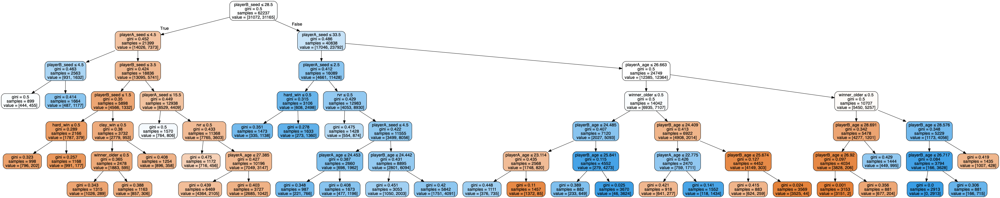

In [156]:
dot_data = StringIO()

export_graphviz(best_model, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_cols, 
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [157]:
best_model.feature_importances_

array([1.31261627e-01, 1.49440528e-01, 0.00000000e+00, 0.00000000e+00,
       0.00000000e+00, 2.71414945e-03, 2.90550576e-04, 0.00000000e+00,
       0.00000000e+00, 7.12489440e-04, 7.82017351e-02, 3.89657987e-01,
       2.47720934e-01])

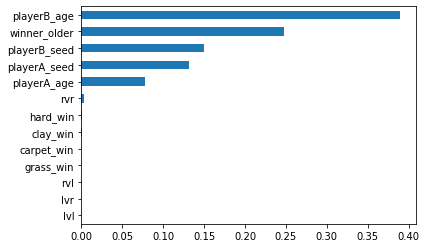

In [158]:
pd.Series(best_model.feature_importances_, index = feature_cols).sort_values().plot.barh()

In [159]:
feature_cols = ['playerA_seed','playerB_seed','lvl','lvr','rvl','rvr', 'clay_win', 'grass_win', 'carpet_win', 'hard_win', 'winner_older']
# here i am checking the new seeds, went back and changed all NA seeds to max because that makes sense. All this did
# in prior models was bring down accuracy, but it may add value to this. 
X = trying_merges[feature_cols] # Features
y = trying_merges.playerA_win # Target variable

In [160]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [161]:
train_results = []
test_results = []
n_levels = []
leaf_mins = []
for i in range(3, 7):
    for j in range (20, 1000, 10):
        model = DecisionTreeClassifier(max_depth = i, min_samples_leaf = j).fit(X_train,y_train)
        preds_test = model.predict(X_test)
        preds_train = model.predict(X_train)
        acc_test = accuracy_score(y_test, preds_test)
        acc_train = accuracy_score(y_train, preds_train)
        train_results.append(acc_train)
        test_results.append(acc_test)
        n_levels.append(i)
        leaf_mins.append(j)
    
our_stuff = {'levels': n_levels, 'leaves': leaf_mins, 'train': train_results, 'test': test_results}  
    
df = pd.DataFrame(our_stuff)

In [162]:
df.sort_values(by = 'test', ascending = False)

,levels,leaves,train,test
334,6,420,0.623664,0.621227
196,5,20,0.625030,0.620815
204,5,100,0.625030,0.620815
212,5,180,0.625030,0.620815
210,5,160,0.625030,0.620815
...,...,...,...,...
384,6,920,0.621286,0.614966
383,6,910,0.621286,0.614966
382,6,900,0.621286,0.614966
381,6,890,0.621286,0.614966


In [163]:
# Create Decision Tree classifer object
all_features_model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 420)
# I feel good about this... low depth, high min samples.

# Train Decision Tree Classifer
all_features_model = all_features_model.fit(X_train,y_train)

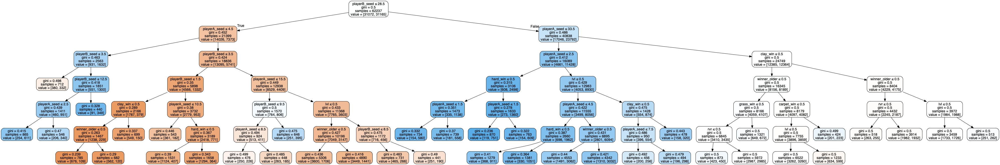

In [164]:
dot_data = StringIO()

export_graphviz(all_features_model, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_cols, 
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [165]:
all_features_model.feature_importances_

array([4.56368612e-01, 5.25592214e-01, 9.47257892e-03, 0.00000000e+00,
       0.00000000e+00, 1.08766470e-04, 2.37812855e-03, 3.04935527e-05,
       1.87737750e-04, 3.54760853e-03, 2.31386071e-03])

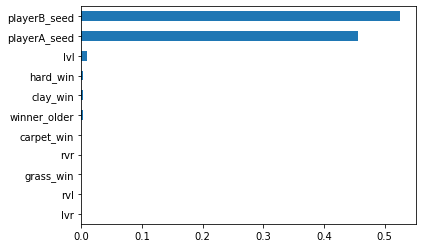

In [166]:
pd.Series(all_features_model.feature_importances_, index = feature_cols).sort_values().plot.barh()

In [167]:
acc_test = accuracy_score(y_test, preds_test)
acc_train = accuracy_score(y_train, preds_train)

print('test acc {0}, \ntrain acc {1}'.format(acc_test, acc_train))

test acc 0.6149664454692011, 
train acc 0.6212863730578273


In [168]:
pred_labels_test = all_features_model.predict(X_test)


In [169]:
# roc Auc score 
test_auc = roc_auc_score(y_test, preds_test)
print('test AUC {}'.format(test_auc))

# classifcation Report 
report = classification_report(y_test, pred_labels_test)
print(report)

# confusion Matrix
cm = confusion_matrix(y_test, pred_labels_test)

print('TN, FP \n FN TP')
print(cm)

test AUC 0.6153468679057644
              precision    recall  f1-score   support

           0       0.59      0.78      0.67     13383
           1       0.67      0.47      0.55     13290

    accuracy                           0.62     26673
   macro avg       0.63      0.62      0.61     26673
weighted avg       0.63      0.62      0.61     26673

TN, FP 
 FN TP
[[10378  3005]
 [ 7098  6192]]


In [ ]:
# this is the model we used in our presentation

In [170]:
feature_cols = ['playerA_seed','playerB_seed','lvl','lvr','rvl','rvr', 'clay_win', 'grass_win', 'carpet_win', 'hard_win', 'playerA_age', 'playerB_age']
# here i am checking the new seeds, went back and changed all NA seeds to max because that makes sense. All this did
# in prior models was bring down accuracy, but it may add value to this. 
X = trying_merges[feature_cols] # Features
y = trying_merges.playerA_win # Target variable

In [171]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [172]:
train_results = []
test_results = []
n_levels = []
leaf_mins = []
for i in range(3, 7):
    for j in range (20, 1000, 10):
        model = DecisionTreeClassifier(max_depth = i, min_samples_leaf = j).fit(X_train,y_train)
        preds_test = model.predict(X_test)
        preds_train = model.predict(X_train)
        acc_test = accuracy_score(y_test, preds_test)
        acc_train = accuracy_score(y_train, preds_train)
        train_results.append(acc_train)
        test_results.append(acc_test)
        n_levels.append(i)
        leaf_mins.append(j)
    
our_stuff = {'levels': n_levels, 'leaves': leaf_mins, 'train': train_results, 'test': test_results}  
    
df = pd.DataFrame(our_stuff)

In [173]:
df.sort_values(by = 'test', ascending = False)

,levels,leaves,train,test
327,6,350,0.626749,0.628913
326,6,340,0.626749,0.628913
325,6,330,0.626685,0.628838
324,6,320,0.626733,0.628801
332,6,400,0.626203,0.628763
...,...,...,...,...
20,3,220,0.621431,0.619615
19,3,210,0.621431,0.619615
18,3,200,0.621431,0.619615
40,3,420,0.620499,0.618266


In [174]:
# Create Decision Tree classifer object
player_ages_model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 350)
# I feel good about this... low depth, high min samples.

# Train Decision Tree Classifer
player_ages_model = player_ages_model.fit(X_train,y_train)

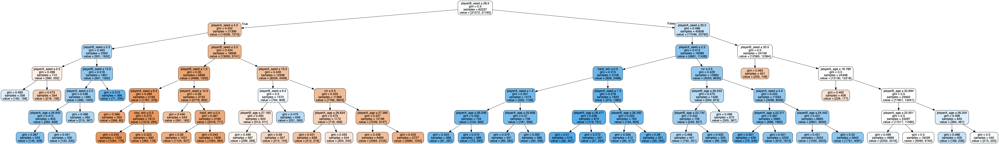

In [175]:
dot_data = StringIO()

export_graphviz(player_ages_model, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_cols, 
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [176]:
player_ages_model.feature_importances_

array([0.45035084, 0.5190375 , 0.        , 0.        , 0.        ,
       0.00913702, 0.00079395, 0.        , 0.        , 0.00257765,
       0.00976686, 0.00833617])

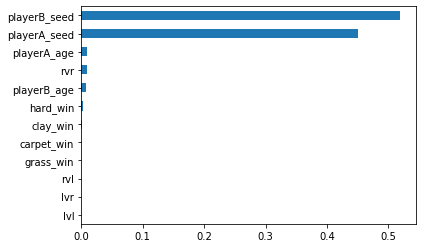

In [177]:
pd.Series(player_ages_model.feature_importances_, index = feature_cols).sort_values().plot.barh()

In [178]:
acc_test = accuracy_score(y_test, preds_test)
acc_train = accuracy_score(y_train, preds_train)

print('test acc {0}, \ntrain acc {1}'.format(acc_test, acc_train))

test acc 0.6246016571064372, 
train acc 0.6271992544627794


In [179]:
pred_labels_test = player_ages_model.predict(X_test)


In [180]:
# roc Auc score 
test_auc = roc_auc_score(y_test, preds_test)
print('test AUC {}'.format(test_auc))

# classifcation Report 
report = classification_report(y_test, pred_labels_test)
print(report)

# confusion Matrix
cm = confusion_matrix(y_test, pred_labels_test)

print('TN, FP \n FN TP')
print(cm)

test AUC 0.6246612772613888
              precision    recall  f1-score   support

           0       0.61      0.75      0.67     13383
           1       0.67      0.51      0.58     13290

    accuracy                           0.63     26673
   macro avg       0.64      0.63      0.62     26673
weighted avg       0.64      0.63      0.62     26673

TN, FP 
 FN TP
[[9972 3411]
 [6487 6803]]


In [181]:
feature_cols = ['lvl','lvr','rvl','rvr', 'clay_win', 'grass_win', 'carpet_win', 'hard_win','playerA_age', 'playerB_age']
# here i am checking the new seeds, went back and changed all NA seeds to max because that makes sense. All this did
# in prior models was bring down accuracy, but it may add value to this. 
X = trying_merges[feature_cols] # Features
y = trying_merges.playerA_win # Target variable

In [182]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [183]:
train_results = []
test_results = []
n_levels = []
leaf_mins = []
for i in range(3, 7):
    for j in range (20, 1000, 10):
        model = DecisionTreeClassifier(max_depth = i, min_samples_leaf = j).fit(X_train,y_train)
        preds_test = model.predict(X_test)
        preds_train = model.predict(X_train)
        acc_test = accuracy_score(y_test, preds_test)
        acc_train = accuracy_score(y_train, preds_train)
        train_results.append(acc_train)
        test_results.append(acc_test)
        n_levels.append(i)
        leaf_mins.append(j)
    
our_stuff = {'levels': n_levels, 'leaves': leaf_mins, 'train': train_results, 'test': test_results}  
    
df = pd.DataFrame(our_stuff)

In [184]:
df.sort_values(by = 'test', ascending = False)

,levels,leaves,train,test
333,6,410,0.526777,0.521501
334,6,420,0.526777,0.521501
336,6,440,0.526680,0.521426
340,6,480,0.526407,0.521389
339,6,470,0.526407,0.521389
...,...,...,...,...
22,3,240,0.518004,0.512766
23,3,250,0.518004,0.512766
24,3,260,0.518004,0.512766
1,3,30,0.518004,0.512766


In [185]:
# Create Decision Tree classifer object
no_seeds_model = DecisionTreeClassifier(max_depth = 6, min_samples_leaf = 410)
# I feel good about this... low depth, high min samples.

# Train Decision Tree Classifer
no_seeds_model = no_seeds_model.fit(X_train,y_train)

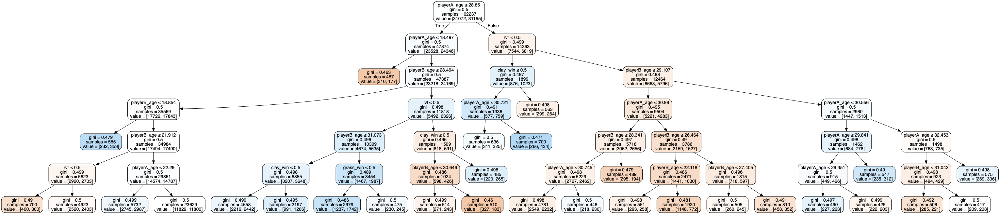

In [186]:
dot_data = StringIO()

export_graphviz(no_seeds_model, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_cols, 
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [187]:
no_seeds_model.feature_importances_

array([0.09143484, 0.        , 0.        , 0.09820121, 0.09184372,
       0.01720931, 0.        , 0.        , 0.33288026, 0.36843067])

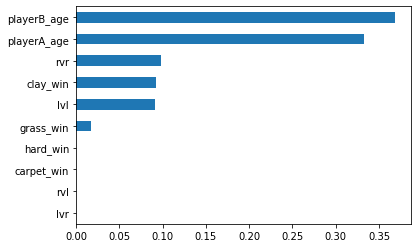

In [188]:
pd.Series(no_seeds_model.feature_importances_, index = feature_cols).sort_values().plot.barh()

In [189]:
acc_test = accuracy_score(y_test, preds_test)
acc_train = accuracy_score(y_train, preds_train)

print('test acc {0}, \ntrain acc {1}'.format(acc_test, acc_train))

test acc 0.5192141866306752, 
train acc 0.5240612497389013


In [190]:
pred_labels_test = no_seeds_model.predict(X_test)


In [191]:
# roc Auc score 
test_auc = roc_auc_score(y_test, preds_test)
print('test AUC {}'.format(test_auc))

# classifcation Report 
report = classification_report(y_test, pred_labels_test)
print(report)

# confusion Matrix
cm = confusion_matrix(y_test, pred_labels_test)

print('TN, FP \n FN TP')
print(cm)

test AUC 0.518545848992413
              precision    recall  f1-score   support

           0       0.52      0.69      0.59     13383
           1       0.53      0.35      0.42     13290

    accuracy                           0.52     26673
   macro avg       0.52      0.52      0.51     26673
weighted avg       0.52      0.52      0.51     26673

TN, FP 
 FN TP
[[9234 4149]
 [8614 4676]]


In [192]:
feature_cols = ['playerA_seed','playerB_seed','lvl','lvr','rvl','rvr', 'clay_win', 'grass_win', 'carpet_win', 'hard_win']
# here i am checking the new seeds, went back and changed all NA seeds to max because that makes sense. All this did
# in prior models was bring down accuracy, but it may add value to this. 
X = trying_merges[feature_cols] # Features
y = trying_merges.playerA_win # Target variable

In [193]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1) # 70% training and 30% test

In [194]:
train_results = []
test_results = []
n_levels = []
leaf_mins = []
for i in range(3, 7):
    for j in range (20, 1000, 10):
        model = DecisionTreeClassifier(max_depth = i, min_samples_leaf = j).fit(X_train,y_train)
        preds_test = model.predict(X_test)
        preds_train = model.predict(X_train)
        acc_test = accuracy_score(y_test, preds_test)
        acc_train = accuracy_score(y_train, preds_train)
        train_results.append(acc_train)
        test_results.append(acc_test)
        n_levels.append(i)
        leaf_mins.append(j)
    
our_stuff = {'levels': n_levels, 'leaves': leaf_mins, 'train': train_results, 'test': test_results}  
    
df = pd.DataFrame(our_stuff)

In [195]:
df.sort_values(by = 'test', ascending = False)

,levels,leaves,train,test
196,5,20,0.624677,0.621640
212,5,180,0.624677,0.621640
198,5,40,0.624677,0.621640
199,5,50,0.624677,0.621640
200,5,60,0.624677,0.621640
...,...,...,...,...
91,3,930,0.619776,0.616354
92,3,940,0.619776,0.616354
94,3,960,0.619776,0.616354
95,3,970,0.619776,0.616354


In [196]:
# Create Decision Tree classifer object
first_model = DecisionTreeClassifier(max_depth = 5, min_samples_leaf = 180)
# I feel good about this... low depth, high min samples.

# Train Decision Tree Classifer
first_model = first_model.fit(X_train,y_train)

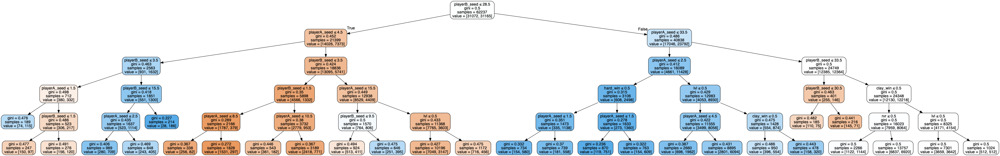

In [197]:
dot_data = StringIO()

export_graphviz(first_model, out_file=dot_data,  
                filled=True, rounded=True,
                feature_names = feature_cols, 
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [198]:
first_model.feature_importances_

array([4.58655541e-01, 5.28992651e-01, 9.28595209e-03, 0.00000000e+00,
       0.00000000e+00, 3.80996044e-06, 1.43191391e-03, 0.00000000e+00,
       0.00000000e+00, 1.63013229e-03])

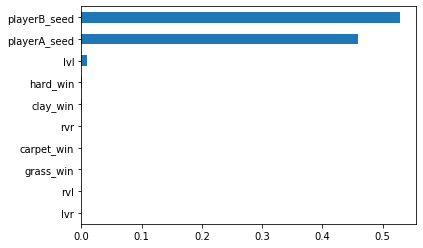

In [199]:
pd.Series(first_model.feature_importances_, index = feature_cols).sort_values().plot.barh()

In [200]:
acc_test = accuracy_score(y_test, preds_test)
acc_train = accuracy_score(y_train, preds_train)

print('test acc {0}, \ntrain acc {1}'.format(acc_test, acc_train))

test acc 0.6179657331383797, 
train acc 0.620643668557289


In [201]:
pred_labels_test = first_model.predict(X_test)


In [202]:
# roc Auc score 
test_auc = roc_auc_score(y_test, preds_test)
print('test AUC {}'.format(test_auc))

# classifcation Report 
report = classification_report(y_test, pred_labels_test)
print(report)

# confusion Matrix
cm = confusion_matrix(y_test, pred_labels_test)

print('TN, FP \n FN TP')
print(cm)

test AUC 0.6181820067876955
              precision    recall  f1-score   support

           0       0.64      0.56      0.60     13383
           1       0.61      0.68      0.64     13290

    accuracy                           0.62     26673
   macro avg       0.62      0.62      0.62     26673
weighted avg       0.62      0.62      0.62     26673

TN, FP 
 FN TP
[[7558 5825]
 [4267 9023]]
